In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium

In [3]:
data = pd.read_csv('../data/cleaned/clean_earthquakes.csv')
data['Datetime'] = pd.to_datetime(data['Datetime'])

In [4]:
data.isnull().sum()

Tsu                                   0
Vol                                   0
Location Name                         0
Latitude                              0
Longitude                             0
Focal Depth (km)                      0
Mag                                   0
MMI Int                               0
Deaths                                0
Death Description                     0
Missing                               0
Missing Description                   0
Injuries                              0
Injuries Description                  0
Damage ($Mil)                         0
Damage Description                    0
Houses Destroyed                      0
Houses Destroyed Description          0
Houses Damaged                        0
Houses Damaged Description            0
Total Deaths                          0
Total Death Description               0
Total Missing                         0
Total Missing Description             0
Total Injuries                        0


In [5]:
data

,Tsu,Vol,Location Name,Latitude,Longitude,Focal Depth (km),Mag,MMI Int,Deaths,Death Description,...,Total Injuries,Total Injuries Description,Total Damage ($Mil),Total Damage Description,Total Houses Destroyed,Total Houses Destroyed Description,Total Houses Damaged,Total Houses Damaged Description,Datetime,Country
0,False,False,ECUADOR: ESMERALDAS,-2.000,-82.000,25.0,7.8,0,0,0,...,0,0,0.0,0,0,0,0,0,1901-01-07 00:29:00,ECUADOR
1,False,False,CHINA: YUNNAN PROVINCE,26.000,100.100,0.0,6.0,8,0,3,...,0,0,0.0,3,0,3,0,0,1901-02-15 00:00:00,CHINA
2,True,False,CALIFORNIA: SAN DIEGO,36.000,-120.500,0.0,6.4,8,0,0,...,0,0,0.0,1,0,0,0,0,1901-03-03 07:45:00,CALIFORNIA
3,False,False,"BULGARIA: BALCHIK, KAVARNA, BLATNITSA, LIMANU",43.400,28.700,0.0,6.4,8,4,1,...,50,1,0.0,0,1200,4,0,0,1901-03-31 07:11:00,BULGARIA
4,True,False,BULGARIA: BALCHIK,43.400,28.500,0.0,7.2,10,4,1,...,50,1,0.0,3,1200,4,0,0,1901-03-31 07:12:00,BULGARIA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3839,True,False,KERMADEC ISLANDS,-30.115,-176.112,22.0,7.0,8,0,0,...,0,0,0.0,0,0,0,0,0,2023-03-16 00:56:02,KERMADEC ISLANDS
3840,False,False,"ECUADOR: AZUAY, EL ORO, GUAYAS",-2.837,-79.844,65.0,6.8,9,14,1,...,494,3,0.0,3,258,3,972,3,2023-03-18 17:12:52,ECUADOR
3841,False,False,AFGHANISTAN: LAGHMAN; PAKISTAN,36.523,70.979,187.0,6.5,7,14,1,...,181,3,0.0,2,22,1,803,3,2023-03-21 16:47:23,AFGHANISTAN
3842,False,False,TAJIKISTAN: SUGHD,39.383,69.881,11.0,5.8,6,0,0,...,3,1,0.0,2,0,0,399,0,2023-03-22 20:07:44,TAJIKISTAN


In [6]:
#What earthquakle had the highest magnitude?

In [7]:
max_magnitude = data['Mag'].max()
max_magnitude_row = data.loc[data['Mag'].idxmax()]

print("The earthquake with the highest magnitude was:")
print("Location Name:", max_magnitude_row['Location Name'])
print("Magnitude:", max_magnitude)
print("Date and time:", max_magnitude_row['Datetime'])
print("Deaths:", max_magnitude_row['Deaths'])

The earthquake with the highest magnitude was:
Location Name: CHILE:  PUERTO MONTT, VALDIVIA
Magnitude: 9.5
Date and time: 1960-05-22 19:11:17
Deaths: 2000


In [8]:
#Whats the total amount of reported deaths

In [9]:
total_deaths = data["Deaths"].sum()
print("Total reported deaths:", total_deaths)

Total reported deaths: 2226237


In [10]:
max_death = data['Deaths'].max()
max_death_row = data.loc[data['Deaths'].idxmax()]
print("The earthquake with the highest deaths was:")
print("Location Name:", max_death_row['Location Name'])
print("Deaths:", max_death)
print("Date and time:", max_death_row['Datetime'])
print("Magnitude:", max_death_row['Mag'])

The earthquake with the highest deaths was:
Location Name: HAITI:  PORT-AU-PRINCE
Deaths: 316000
Date and time: 2010-01-12 21:53:10
Magnitude: 7.0


In [11]:
#How likely for an earthquake in my region

In [12]:
region_name = input("Enter the name of your region: ")
region_data = data[data['Location Name'].str.contains(region_name, case=False)]
prob = len(region_data) / len(data)
print(prob)

Enter the name of your region: united kingdom
0.0013007284079084287


In [13]:
#average earthquake magnitude by country

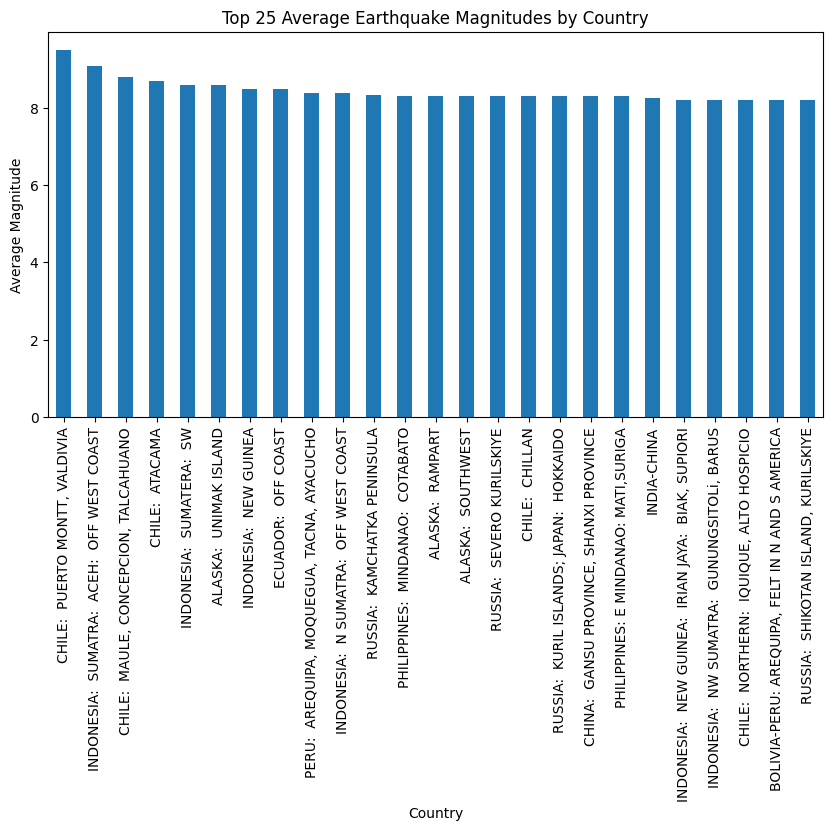

In [14]:
mag_by_country = data.groupby('Location Name')['Mag'].mean().sort_values(ascending=False)
top_mag_by_country = mag_by_country.head(25)
top_mag_by_country.plot(kind='bar', figsize=(10, 5))
plt.xlabel('Country')
plt.ylabel('Average Magnitude')
plt.title('Top 25 Average Earthquake Magnitudes by Country')
plt.show()

In [15]:
#number of earthquakes by countries

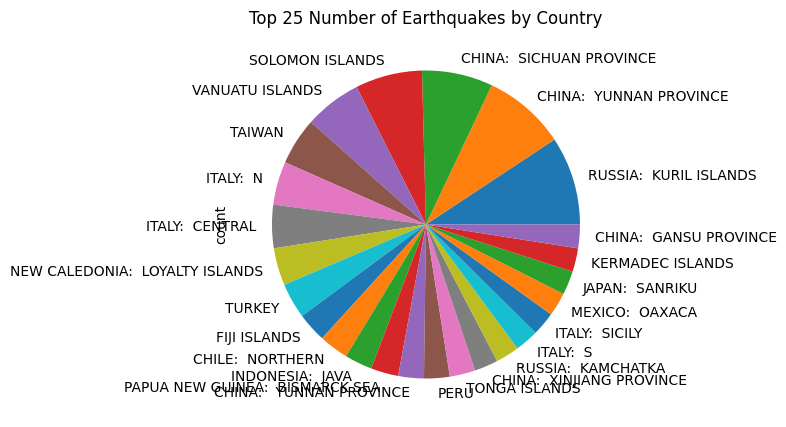

In [16]:
count_by_country = data['Location Name'].value_counts().sort_values(ascending=False)
top_count_by_country = count_by_country.head(25)
top_count_by_country.plot(kind='pie', figsize=(10, 5))
plt.title('Top 25 Number of Earthquakes by Country')
plt.show()

In [17]:
#on one country do earthquakes get heavier. time line. 

In [18]:
data['Datetime'].isna().sum()

0

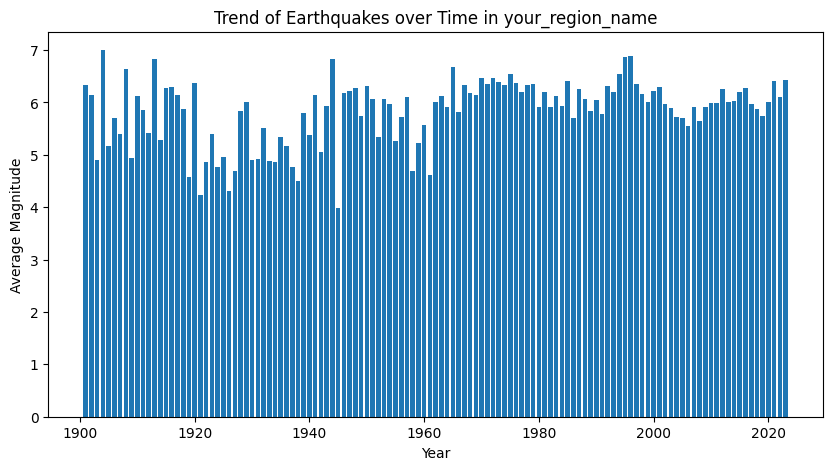

In [19]:
data_yearly = data.groupby(data['Datetime'].dt.year)['Mag'].mean()

# Create bar chart
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(data_yearly.index, data_yearly.values)
plt.xlabel('Year')
plt.ylabel('Average Magnitude')
plt.title('Trend of Earthquakes over Time in your_region_name')
plt.show()

In [20]:
# Convert datetime column to datetime format with errors set to 'coerce'
#data['Datetime'] = pd.to_datetime(data['Datetime'], format='%Y-%m-%d %H:%M:%S', errors='coerce')

# Check if any values are NaT
if data['Datetime'].isna().any():
    print('no match')
else:
    print('match')


match


In [21]:
#Relationship between magnitude and depth

In [22]:
data

,Tsu,Vol,Location Name,Latitude,Longitude,Focal Depth (km),Mag,MMI Int,Deaths,Death Description,...,Total Injuries,Total Injuries Description,Total Damage ($Mil),Total Damage Description,Total Houses Destroyed,Total Houses Destroyed Description,Total Houses Damaged,Total Houses Damaged Description,Datetime,Country
0,False,False,ECUADOR: ESMERALDAS,-2.000,-82.000,25.0,7.8,0,0,0,...,0,0,0.0,0,0,0,0,0,1901-01-07 00:29:00,ECUADOR
1,False,False,CHINA: YUNNAN PROVINCE,26.000,100.100,0.0,6.0,8,0,3,...,0,0,0.0,3,0,3,0,0,1901-02-15 00:00:00,CHINA
2,True,False,CALIFORNIA: SAN DIEGO,36.000,-120.500,0.0,6.4,8,0,0,...,0,0,0.0,1,0,0,0,0,1901-03-03 07:45:00,CALIFORNIA
3,False,False,"BULGARIA: BALCHIK, KAVARNA, BLATNITSA, LIMANU",43.400,28.700,0.0,6.4,8,4,1,...,50,1,0.0,0,1200,4,0,0,1901-03-31 07:11:00,BULGARIA
4,True,False,BULGARIA: BALCHIK,43.400,28.500,0.0,7.2,10,4,1,...,50,1,0.0,3,1200,4,0,0,1901-03-31 07:12:00,BULGARIA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3839,True,False,KERMADEC ISLANDS,-30.115,-176.112,22.0,7.0,8,0,0,...,0,0,0.0,0,0,0,0,0,2023-03-16 00:56:02,KERMADEC ISLANDS
3840,False,False,"ECUADOR: AZUAY, EL ORO, GUAYAS",-2.837,-79.844,65.0,6.8,9,14,1,...,494,3,0.0,3,258,3,972,3,2023-03-18 17:12:52,ECUADOR
3841,False,False,AFGHANISTAN: LAGHMAN; PAKISTAN,36.523,70.979,187.0,6.5,7,14,1,...,181,3,0.0,2,22,1,803,3,2023-03-21 16:47:23,AFGHANISTAN
3842,False,False,TAJIKISTAN: SUGHD,39.383,69.881,11.0,5.8,6,0,0,...,3,1,0.0,2,0,0,399,0,2023-03-22 20:07:44,TAJIKISTAN


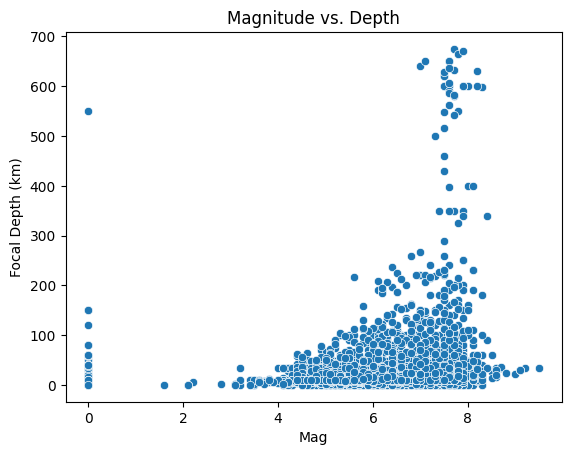

In [23]:
sns.scatterplot(data=data, x="Mag", y="Focal Depth (km)")
plt.title("Magnitude vs. Depth")
plt.show()

In [24]:
#Visualize the geographical distribution of earthquakes:

In [25]:
import folium

map = folium.Map(location=[data["Latitude"].mean(), data["Longitude"].mean()], zoom_start=3)

for i, row in data.iterrows():
    folium.Marker(location=[row["Latitude"], row["Longitude"]], 
                  tooltip=row["Location Name"],
                  icon=folium.Icon(color="red" if row["Mag"] >= 6 else "orange" if row["Mag"] >= 5 else "yellow")).add_to(map)
    
map


C:\Users\Playtime\AppData\Local\Temp\ipykernel_31152\479285456.py:8: UserWarning: color argument of Icon should be one of: {'lightgreen', 'purple', 'lightred', 'beige', 'orange', 'white', 'darkred', 'gray', 'red', 'darkgreen', 'lightgray', 'darkpurple', 'darkblue', 'blue', 'green', 'lightblue', 'pink', 'black', 'cadetblue'}.
  icon=folium.Icon(color="red" if row["Mag"] >= 6 else "orange" if row["Mag"] >= 5 else "yellow")).add_to(map)


In [26]:
import folium
from folium.plugins import HeatMap

# Create map object centered on the mean latitude and longitude of the data
map = folium.Map(location=[data["Latitude"].mean(), data["Longitude"].mean()], zoom_start=3)

# Create a list of latitudes and longitudes from the data
locations = data[["Latitude", "Longitude"]].values.tolist()

# Create a heatmap layer using the locations list
HeatMap(locations).add_to(map)

# Display the map
map


In [27]:
import folium
from folium.plugins import HeatMap

# Create map object centered on the mean latitude and longitude of the data
map = folium.Map(location=[data["Latitude"].mean(), data["Longitude"].mean()], zoom_start=3)

# Create a list of latitudes and longitudes from the data
locations = data[["Latitude", "Longitude"]].values.tolist()

# Create a heatmap layer using the locations list
HeatMap(locations).add_to(map)

# Add markers for volcanoes and tsunamis
for i, row in data.iterrows():
    if row['Vol'] == True:
        folium.Marker(location=[row["Latitude"], row["Longitude"]], 
                      tooltip=row["Location Name"],
                      icon=folium.Icon(color="red", prefix='fa', icon='fire')).add_to(map)
    elif row['Tsu'] == True:
        folium.Marker(location=[row["Latitude"], row["Longitude"]], 
                      tooltip=row["Location Name"],
                      icon=folium.Icon(color="blue", prefix='fa', icon='tint')).add_to(map)
    else:
        pass
        

# Display the map
map


In [28]:
# Create map object centered on the mean latitude and longitude of the data
map = folium.Map(location=[data["Latitude"].mean(), data["Longitude"].mean()], zoom_start=3)

# Create a list of latitudes and longitudes from the data
locations = data[["Latitude", "Longitude"]].values.tolist()

# Create feature groups for the different markers
volcano_fg = folium.FeatureGroup(name="Volcano")
tsunami_fg = folium.FeatureGroup(name="Tsunami")
other_fg = folium.FeatureGroup(name="Other")

# Loop through the data and add markers to the appropriate feature group
for i, row in data.iterrows():
    if row["Vol"] == True:
        folium.Marker(location=[row["Latitude"], row["Longitude"]], 
                      tooltip=row["Location Name"],
                      icon=folium.Icon(color="red", icon = 'fire')).add_to(volcano_fg)
    elif row["Tsu"] == True:
        folium.Marker(location=[row["Latitude"], row["Longitude"]], 
                      tooltip=row["Location Name"],
                      icon=folium.Icon(color="blue", icon = 'tint')).add_to(tsunami_fg)
    else:
        folium.CircleMarker(location=[row["Latitude"], row["Longitude"]], 
                            tooltip=row["Location Name"],
                            color='green', radius=5).add_to(other_fg)

# Add feature groups to the map
volcano_fg.add_to(map)
tsunami_fg.add_to(map)
other_fg.add_to(map)

# Add layer control to toggle feature groups
folium.LayerControl().add_to(map)

# Display the map
map


In [29]:
map.save("my_map.html")

In [30]:
#cant use linear model
#scatter plot mag and damage, might see non linear relationship
#create transformation to be linear

#k nearest neighbours
#logarithimic transitions.

In [31]:
#Focal Depth (km), mag - prediction

In [32]:
#Distribution of earthquake magnitudes~

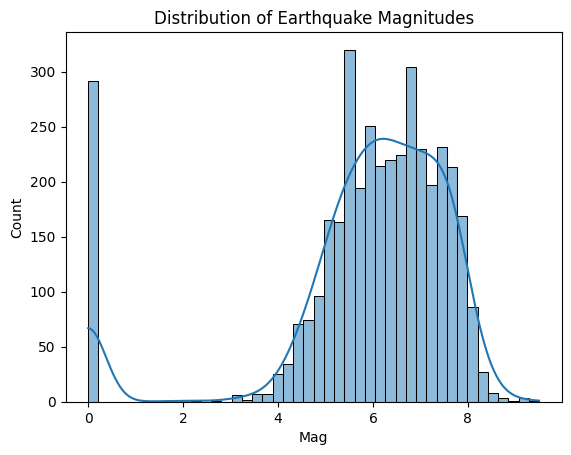

In [33]:
sns.histplot(data=data, x="Mag", kde=True)
plt.title("Distribution of Earthquake Magnitudes")
plt.show()

In [34]:
data.columns

Index(['Tsu', 'Vol', 'Location Name', 'Latitude', 'Longitude',
       'Focal Depth (km)', 'Mag', 'MMI Int', 'Deaths', 'Death Description',
       'Missing', 'Missing Description', 'Injuries', 'Injuries Description',
       'Damage ($Mil)', 'Damage Description', 'Houses Destroyed',
       'Houses Destroyed Description', 'Houses Damaged',
       'Houses Damaged Description', 'Total Deaths', 'Total Death Description',
       'Total Missing', 'Total Missing Description', 'Total Injuries',
       'Total Injuries Description', 'Total Damage ($Mil)',
       'Total Damage Description', 'Total Houses Destroyed',
       'Total Houses Destroyed Description', 'Total Houses Damaged',
       'Total Houses Damaged Description', 'Datetime', 'Country'],
      dtype='object')

In [35]:
#Non-linear relationship

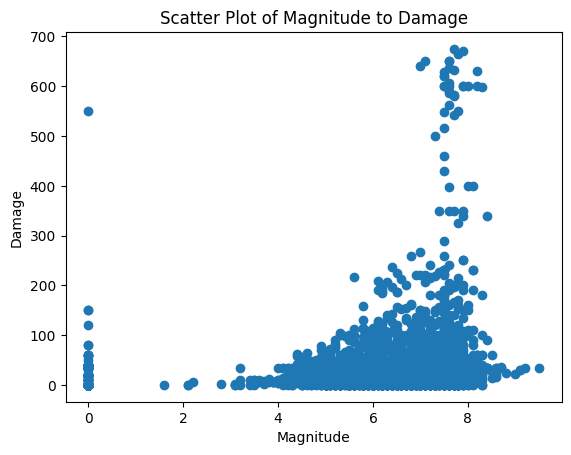

In [36]:
plt.scatter(data['Mag'], data['Focal Depth (km)'])
plt.xlabel('Magnitude')
plt.ylabel('Damage')
plt.title('Scatter Plot of Magnitude to Damage')
plt.show()

In [ ]:
#k nearest neighbour

In [37]:
#Correlation between different variables

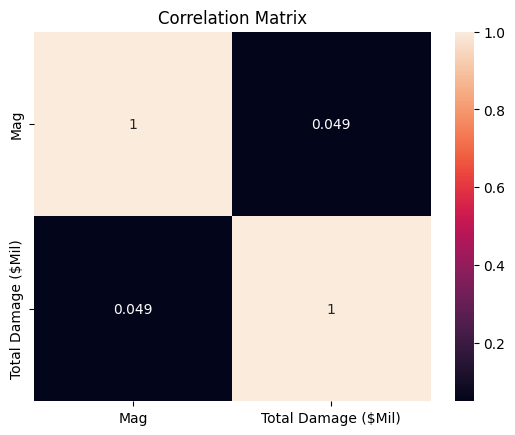

In [38]:
corr = data[["Mag", "Total Damage ($Mil)"]].corr()
sns.heatmap(corr, annot=True)
plt.title("Correlation Matrix")
plt.show()

In [39]:
#one_hot = pd.get_dummies(data['Location Name'])
#data = data.drop('Location Name',axis = 1)
#data = data.join(one_hot)


In [40]:
#corr_matrix = data.corr()
#sns.heatmap(corr_matrix, cmap='coolwarm', annot=True)
#plt.title('Correlation Matrix')
#plt.show()